Test size:  (88457, 162)
Train size:  (5792, 162)
Train frac:  6.145423293615847
subset tr:  (5792, 135)
subset test:  (88457, 135)


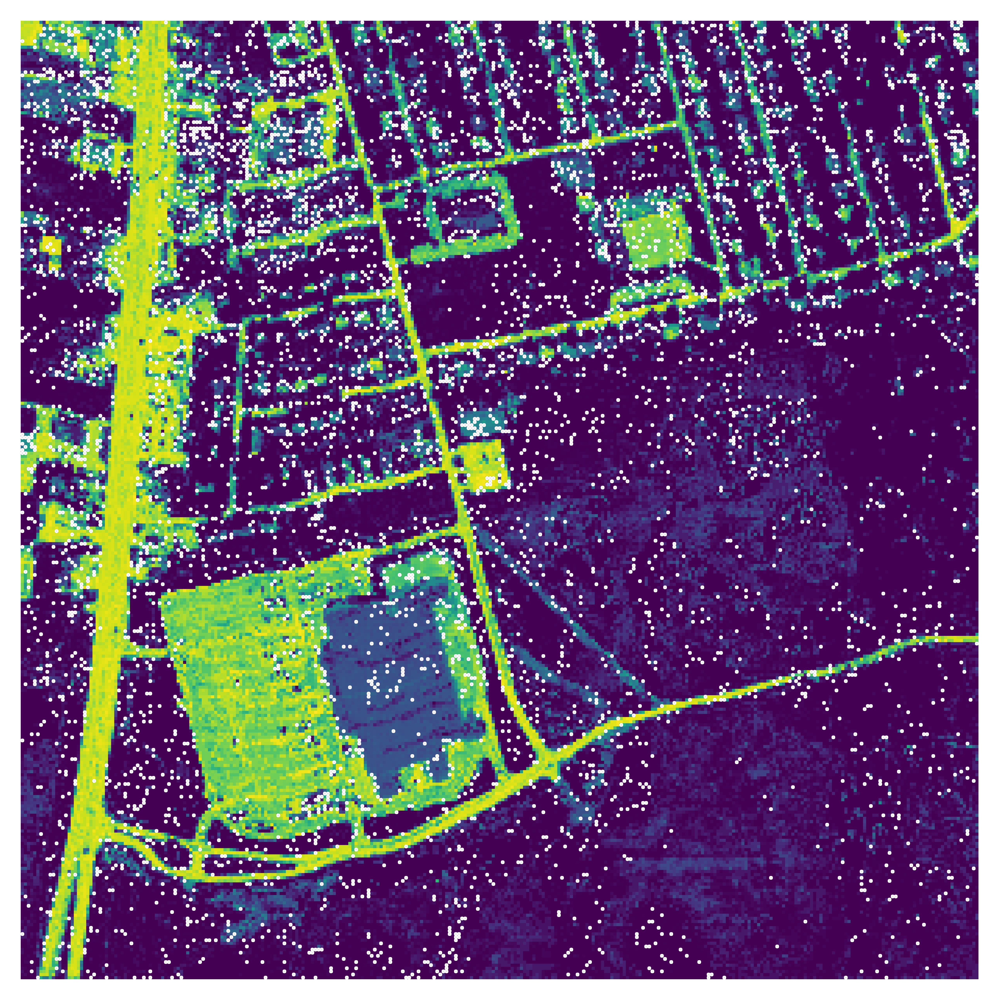

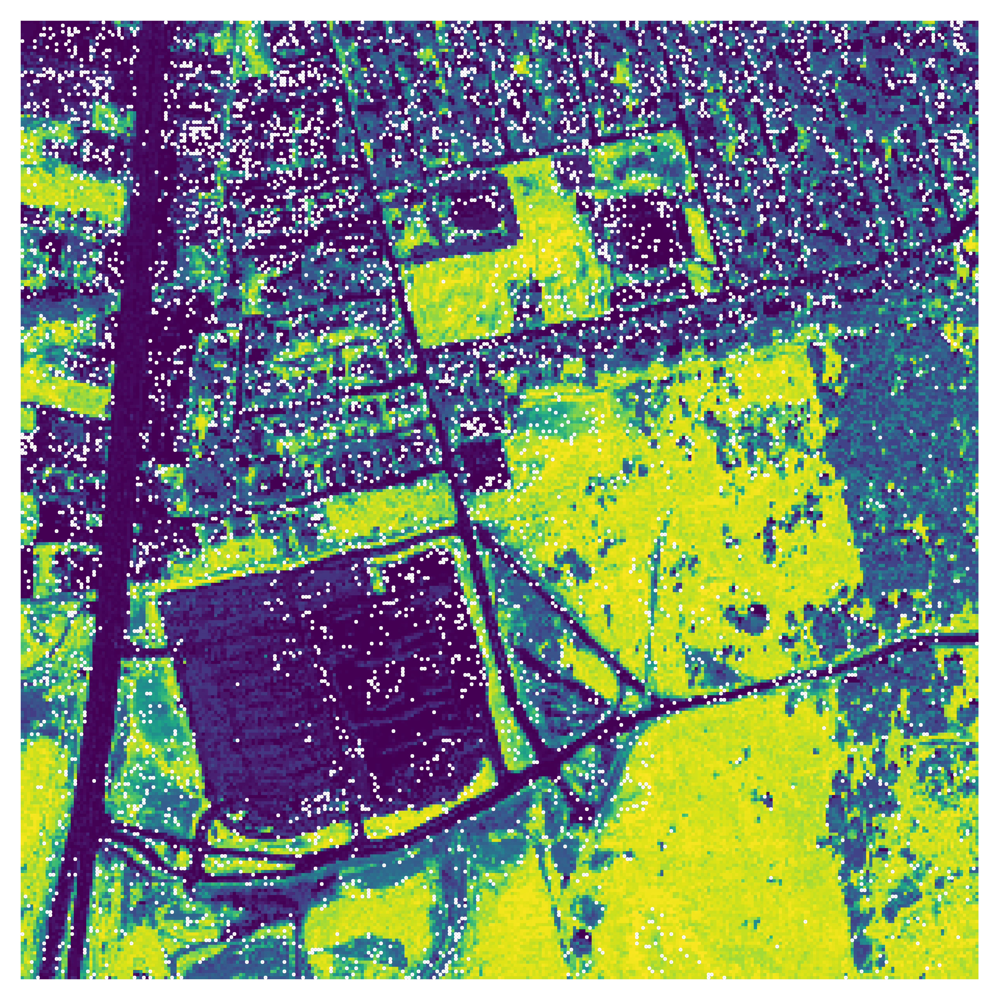

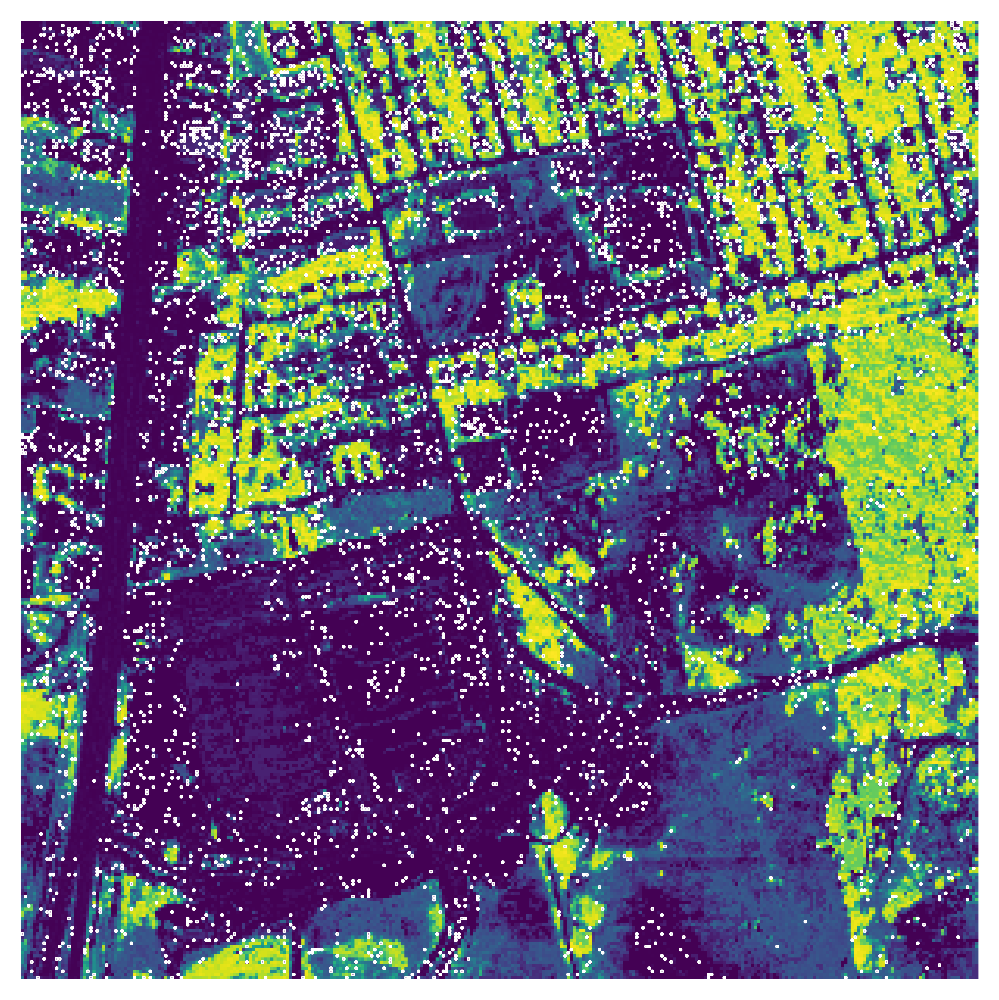

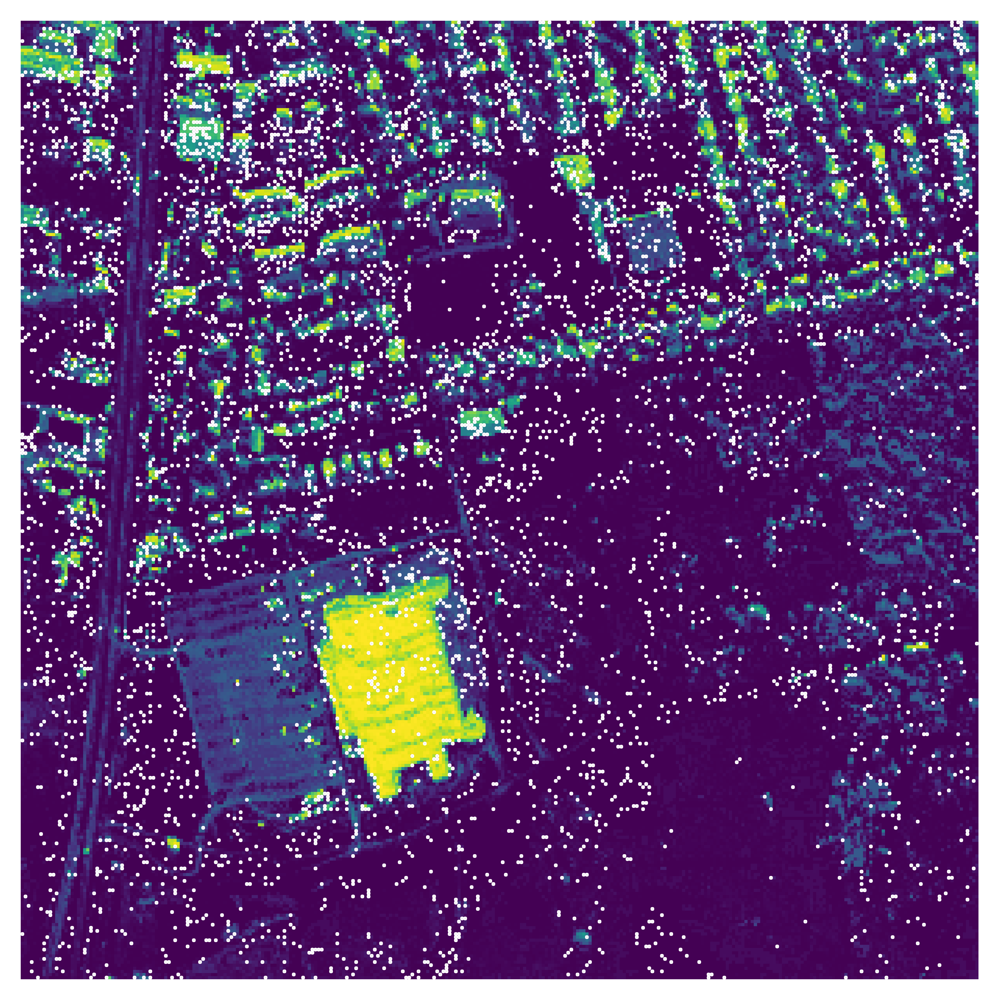

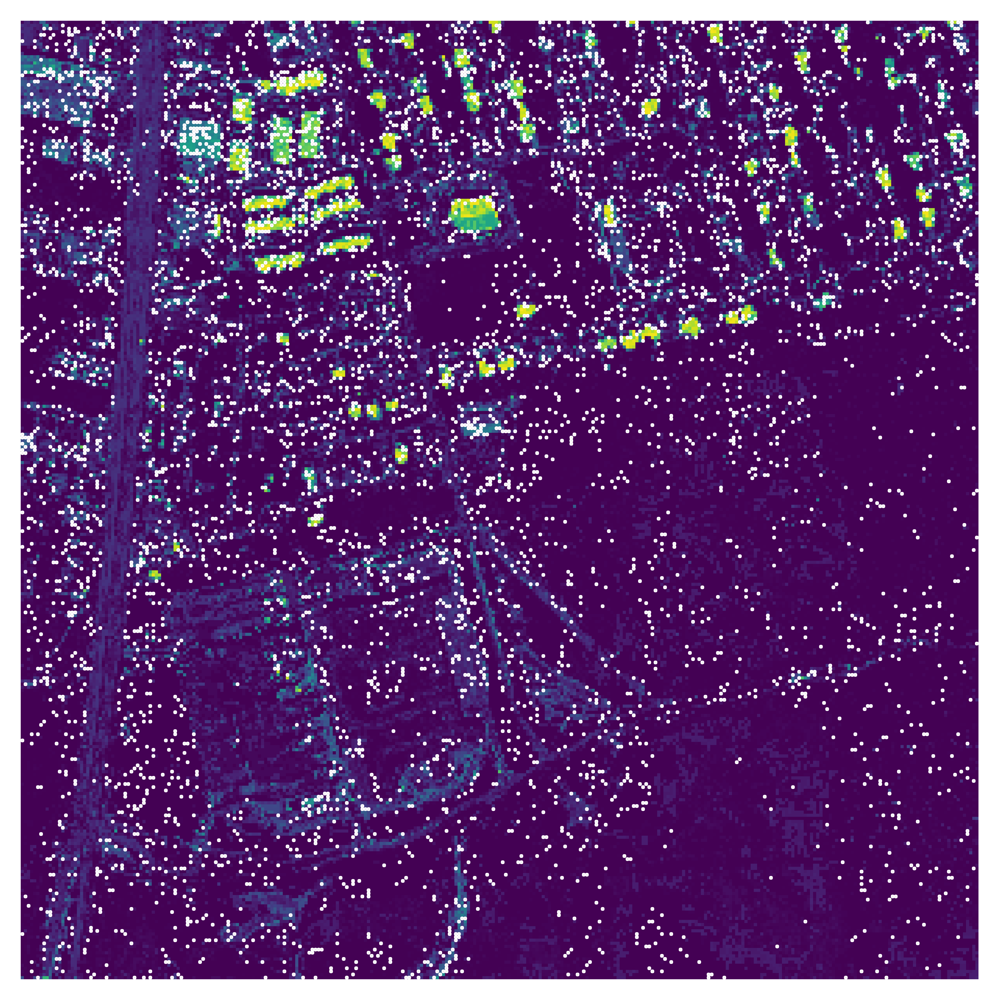

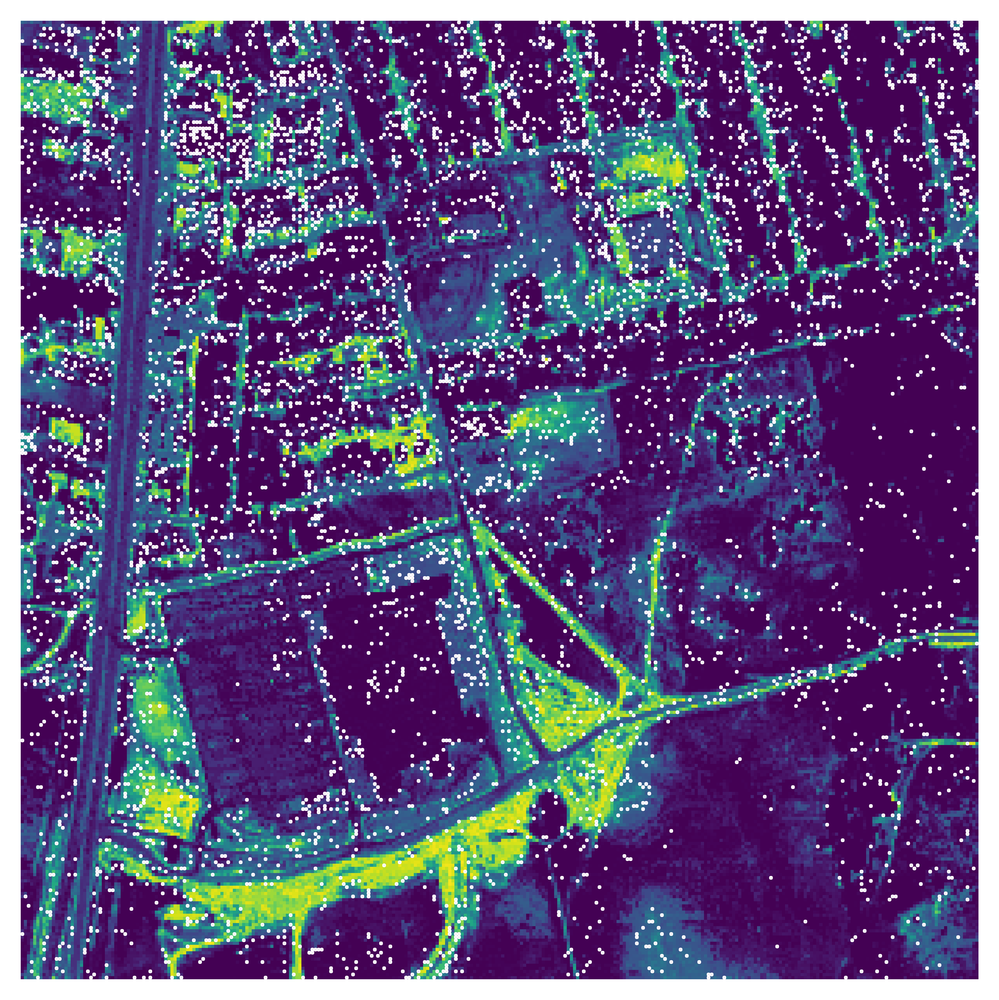

In [45]:
from scipy.stats import wilcoxon
import pandas as pd
import numpy as np


N_ATTRIBUTES = 162
model = "mi"

results = {}
for metric_name in ["mse", "mae", "expl_var", "r2"]:
    for class_index in range(6):
        results[f"{metric_name}_class_{class_index}"] = {}
    results[f"{metric_name}_mean"] = {}
results["time"] = {}

for n_clusters in list(range(5, N_ATTRIBUTES, 5)):
    dfs = []
    for random_state in range(20):
        df = pd.read_csv(
            f"C:\\Users\\luktu\\Downloads\\gawll (1)\\results_test_frac_band_sel_estimators_4_{model}\\n_clusters-{n_clusters},test_size-band_sel,random_state-{random_state}.csv"
        )
        dfs.append(df)
    df = pd.concat(dfs, ignore_index=True).to_dict(orient="list")
    for k, v in df.items():
        results[k][f"bands_{n_clusters}"] = v

mae_means = results["mae_mean"]
mae_means = {k: np.mean(v) for k, v in mae_means.items()}
min_element = min(mae_means.items(), key=lambda x: x[1])
band_index, band_mae = min_element

from runner import run

test_indices, y_pred = run(
    select_bands=True,
    is_random=False,
    n_clusters=int(band_index.replace("bands_", "")),
    n_estimators=4,
    random_state=0,
)

data = np.load("others/urban.npy")
data_re = data.reshape(-1, data.shape[-1])
num_samples = data_re.shape[0]

pred = np.empty(shape=(num_samples, 6))
pred[test_indices] = y_pred

train_indices = np.setdiff1d(np.arange(num_samples), test_indices)
pred[train_indices] = -1
pred = pred.reshape((*data.shape[:2], 6))

pred_mask = pred.copy()
pred_masks = []

for i in range(6):
    pred_masks.append(pred[..., i] == -1)
pred = pred.reshape(-1, 6)
pred[train_indices] = 0
pred = pred.reshape((*data.shape[:2], 6))
gt = np.load("others/urban_gt.npy").T.reshape(-1, 6)
gt = gt.reshape((*data.shape[:2], 6))
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt

for target_index in range(6):
    # cmap = plt.get_cmap('viridis')
    # cmap_colors = cmap(np.arange(cmap.N))
    # cmap_colors[2] = [1, 0, 0, 1]  # RGBA values for white
    # custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', cmap_colors, cmap.N)

    # Create a larger figure with increased DPI
    fig, ax = plt.subplots(figsize=(6, 6), dpi=1000)
    # target_pred__ = (target_pred__ - target_pred__.min()) / (
    #     target_pred__.max() - target_pred__.min()
    # )
    # Display the normalized image
    ax.imshow(pred[..., target_index], cmap="viridis")
    ax.scatter(pred_masks[target_index].nonzero()[1], pred_masks[target_index].nonzero()[0], c='white', s=0.1,marker='s')
    # Remove white margins
    ax.set_axis_off()

    # Save the plot without margins
    plt.savefig(
        f"model_{model}_bands_number_{band_index.replace('bands_', '')}_target_class_{target_index}.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

    plt.close()

    # # # Create a larger figure with increased DPI
    # fig, ax = plt.subplots(figsize=(6, 6), dpi=1000)
    # # Display the normalized image
    # ax.imshow(gt[..., target_index], cmap="viridis")
    # ax.scatter(pred_masks[target_index].nonzero()[1], pred_masks[target_index].nonzero()[0], c='white', s=0.1, marker='s')

    # # Remove white margins
    # ax.set_axis_off()
    # # Save the plot without margins
    # plt.savefig(
    #     f"gt_target_{target_index}.png",
    #     bbox_inches="tight",
    #     pad_inches=0,
    # )
    # plt.show()